### Imports

In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm_notebook as tqdm

### Creating pandas dataframe

In [2]:
foldernames = os.listdir('../Data/keggle_data_animals/raw-img')
category_names = []
categories = []
files = []
i = 0
for k, folder in enumerate(foldernames):
    filenames = os.listdir("../Data/keggle_data_animals/raw-img/" + folder);
    for file in filenames:
        files.append("../Data/keggle_data_animals/raw-img/" + folder + "/" + file)
        categories.append(k)
        category_names.append(folder)
        
df = pd.DataFrame({
    'filename': files,
    'category': categories,
    'category_names': category_names
})
train_df = pd.DataFrame(columns=['filename', 'category'])
for i in range(10):
    train_df = train_df.append(df[df.category == i])

train_df.head()
train_df = train_df.reset_index(drop=True)
train_df

,filename,category,category_names
0,../Data/keggle_data_animals/raw-img/cane/OIF-e...,0,cane
1,../Data/keggle_data_animals/raw-img/cane/OIP--...,0,cane
2,../Data/keggle_data_animals/raw-img/cane/OIP--...,0,cane
3,../Data/keggle_data_animals/raw-img/cane/OIP--...,0,cane
4,../Data/keggle_data_animals/raw-img/cane/OIP--...,0,cane
...,...,...,...
26174,../Data/keggle_data_animals/raw-img/scoiattolo...,9,scoiattolo
26175,../Data/keggle_data_animals/raw-img/scoiattolo...,9,scoiattolo
26176,../Data/keggle_data_animals/raw-img/scoiattolo...,9,scoiattolo
26177,../Data/keggle_data_animals/raw-img/scoiattolo...,9,scoiattolo


### Data exploring

In [3]:
train_df['category'].describe()


count     26179
unique       10
top           0
freq       4863
Name: category, dtype: int64

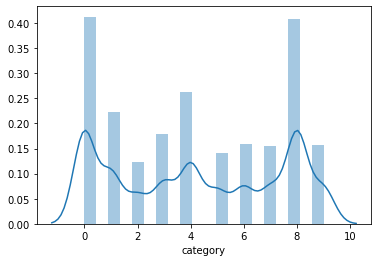

In [4]:
sns.distplot(train_df['category']);

In [5]:
train_df['category'].value_counts()

0    4863
8    4821
4    3098
1    2623
3    2112
6    1866
9    1862
7    1820
5    1668
2    1446
Name: category, dtype: int64

In [6]:
train_df['category_names'].value_counts()

cane          4863
ragno         4821
gallina       3098
cavallo       2623
farfalla      2112
mucca         1866
scoiattolo    1862
pecora        1820
gatto         1668
elefante      1446
Name: category_names, dtype: int64

In [7]:
# First 200 image sizes
for i in range(200):
    img = cv2.imread(train_df['filename'][i])
    print(img.shape)

(225, 300, 3)
(214, 300, 3)
(300, 153, 3)
(225, 300, 3)
(225, 300, 3)
(101, 300, 3)
(182, 300, 3)
(300, 205, 3)
(300, 251, 3)
(300, 200, 3)
(200, 300, 3)
(178, 300, 3)
(169, 300, 3)
(300, 300, 3)
(300, 300, 3)
(300, 169, 3)
(300, 226, 3)
(257, 300, 3)
(280, 300, 3)
(201, 300, 3)
(169, 300, 3)
(300, 201, 3)
(233, 300, 3)
(200, 300, 3)
(265, 300, 3)
(300, 229, 3)
(200, 300, 3)
(225, 300, 3)
(300, 225, 3)
(200, 300, 3)
(169, 300, 3)
(225, 300, 3)
(248, 300, 3)
(225, 300, 3)
(221, 300, 3)
(185, 300, 3)
(169, 300, 3)
(200, 300, 3)
(300, 278, 3)
(173, 300, 3)
(220, 300, 3)
(200, 300, 3)
(200, 300, 3)
(218, 300, 3)
(225, 300, 3)
(300, 166, 3)
(225, 300, 3)
(300, 199, 3)
(300, 225, 3)
(225, 300, 3)
(240, 300, 3)
(279, 300, 3)
(213, 300, 3)
(225, 300, 3)
(300, 197, 3)
(300, 225, 3)
(300, 266, 3)
(164, 300, 3)
(300, 281, 3)
(187, 300, 3)
(300, 201, 3)
(200, 300, 3)
(199, 300, 3)
(225, 300, 3)
(300, 223, 3)
(264, 300, 3)
(300, 300, 3)
(169, 300, 3)
(225, 300, 3)
(300, 296, 3)
(300, 300, 3)
(169, 

### Data visualization

In [8]:
images = []
with tqdm(total=len(train_df)) as pbar:
    for i, file_path in enumerate(train_df.filename.values):
        #read image
        img = cv2.imread(file_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)
        pbar.update(1)

images = np.array(images)

C:\Users\edgar\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


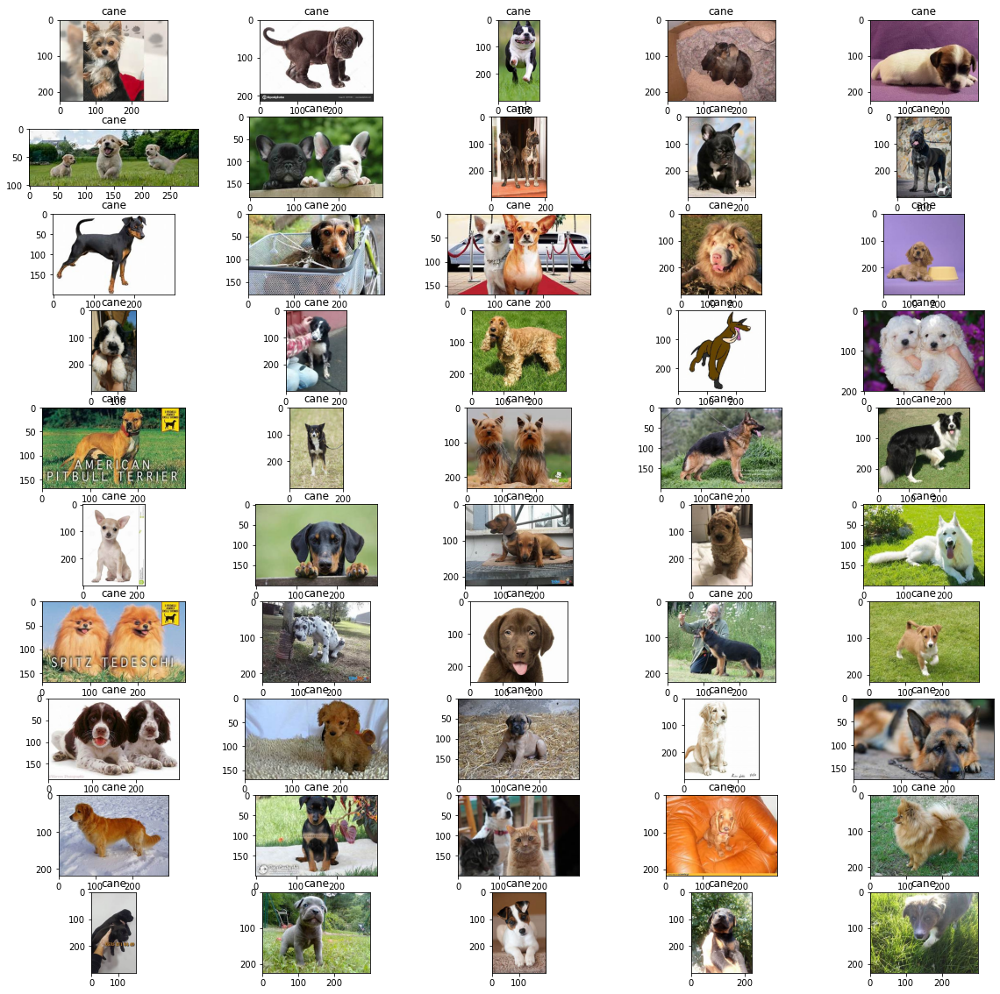

In [9]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 0].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])

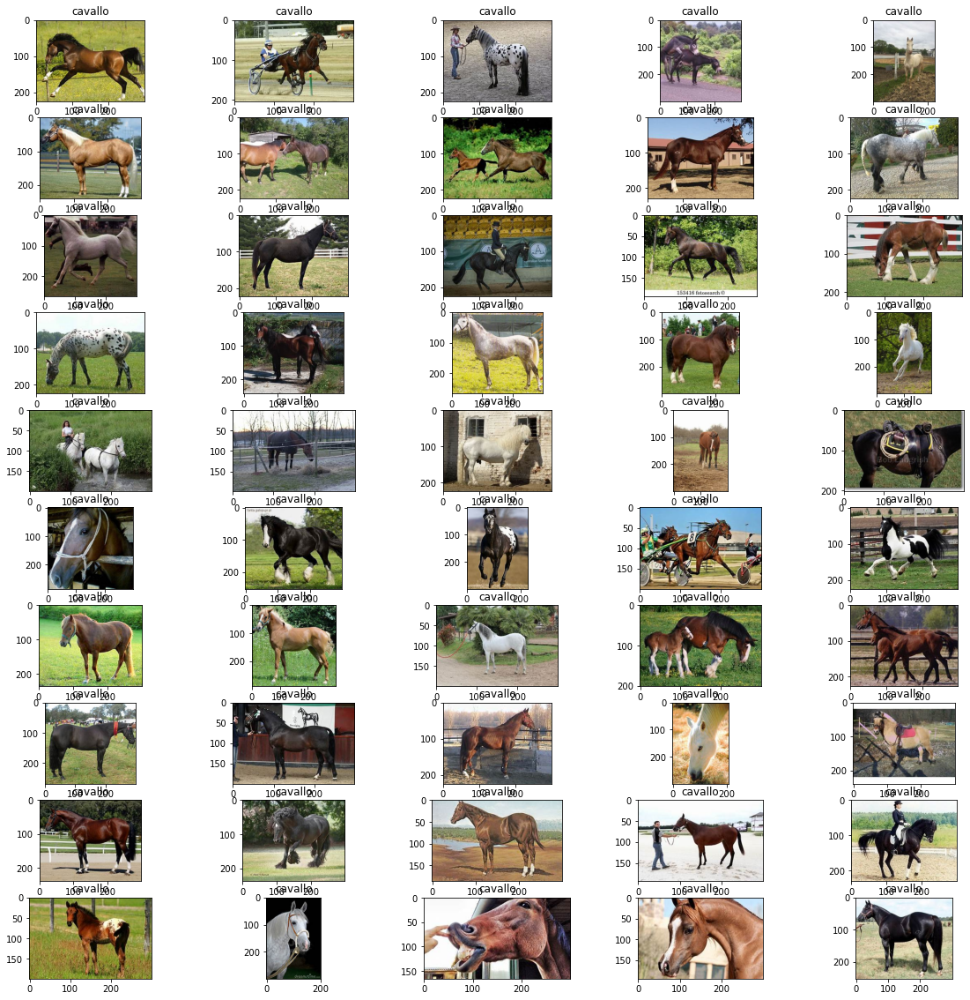

In [12]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 1].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])

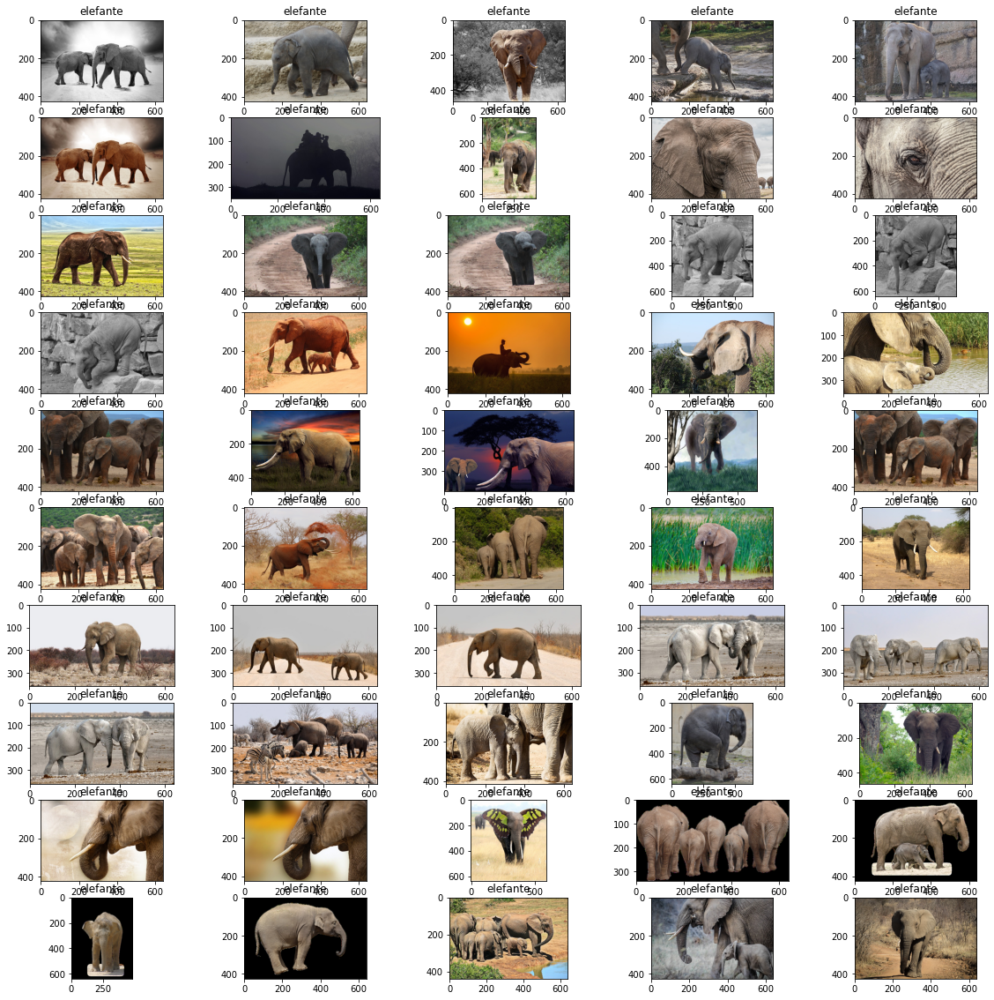

In [13]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 2].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])

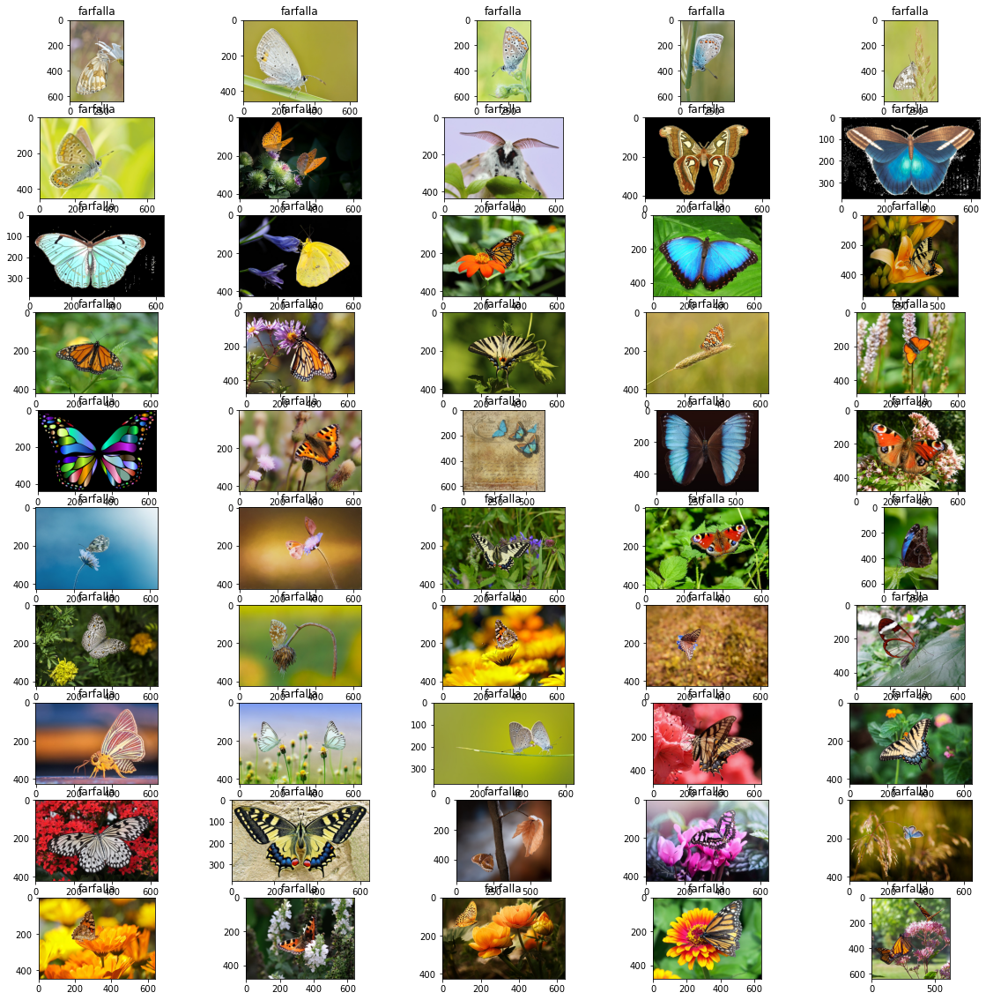

In [14]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 3].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])

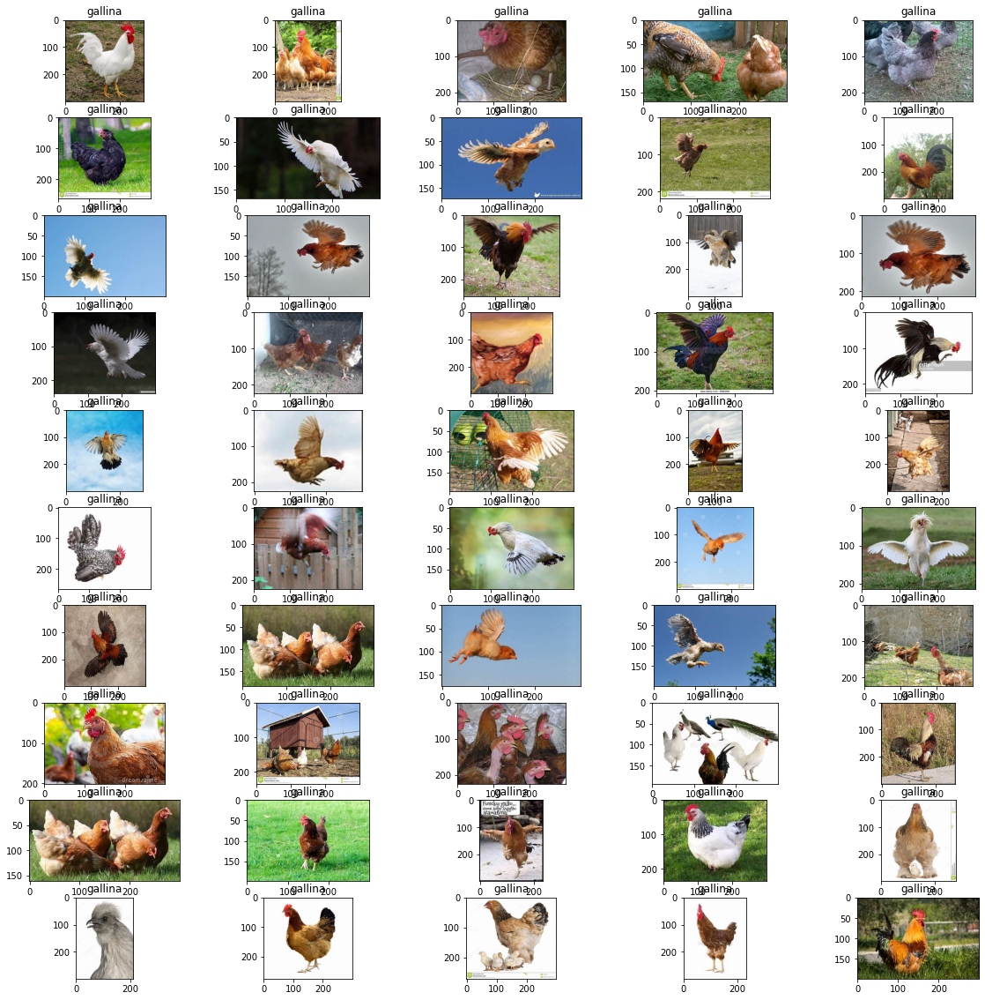

In [15]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 4].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])

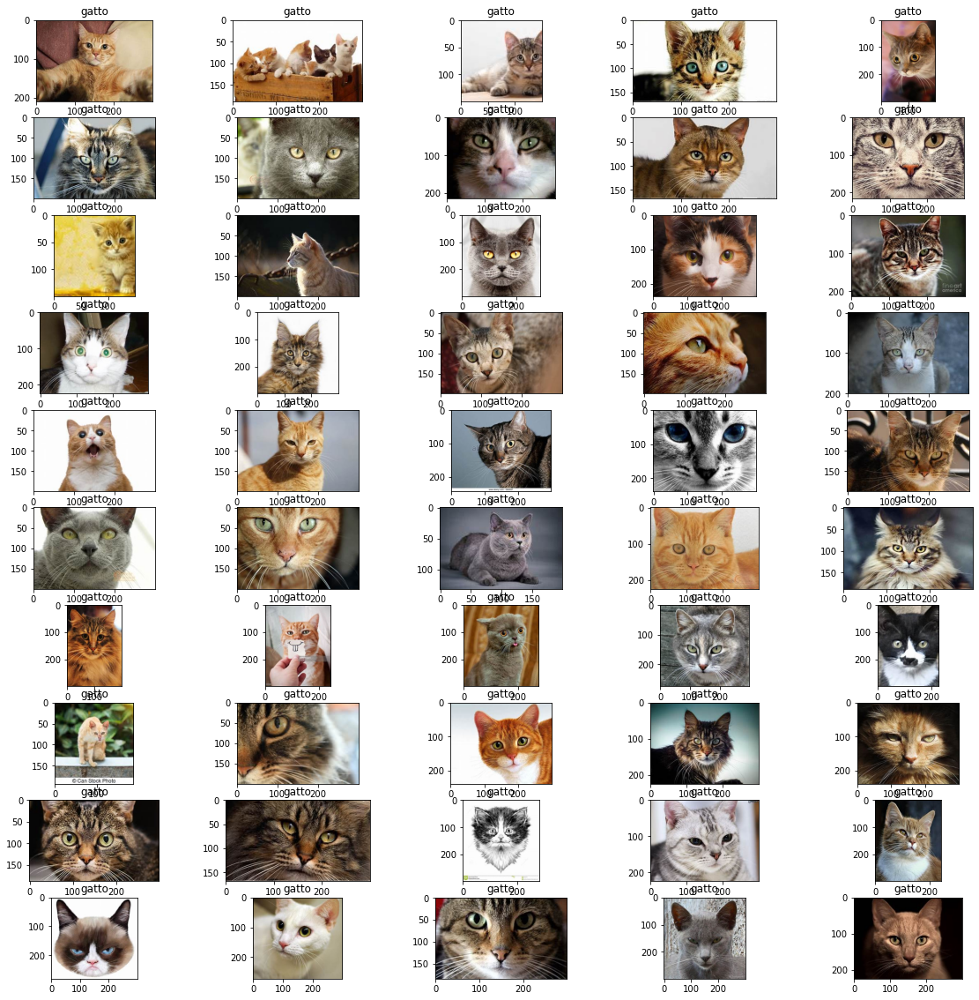

In [16]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 5].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])

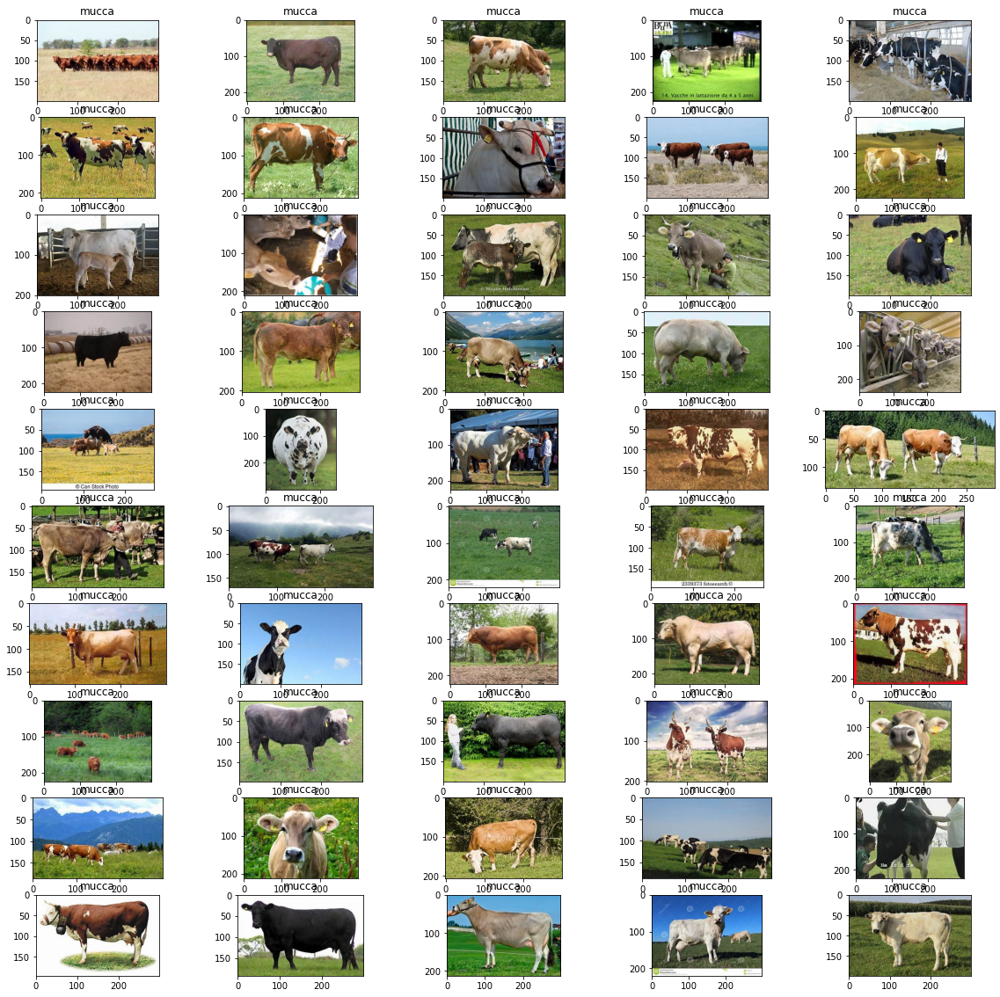

In [17]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 6].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])

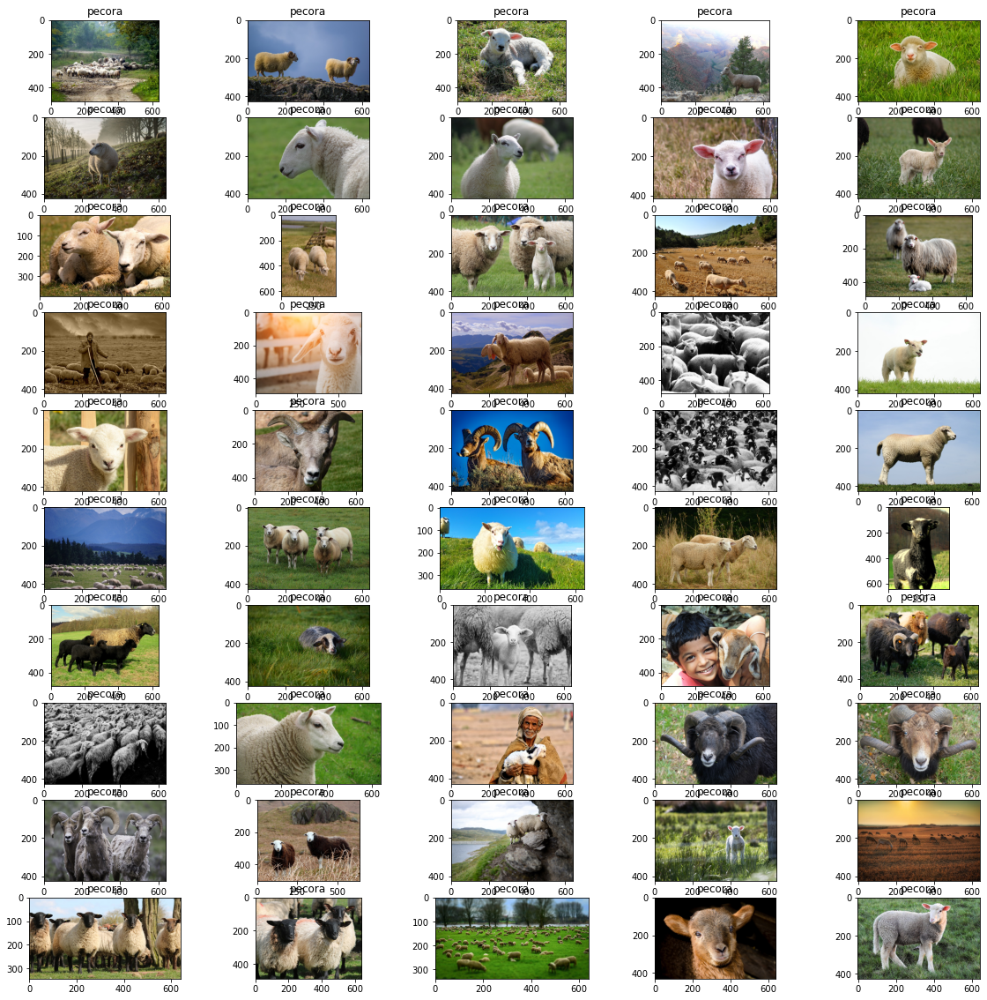

In [18]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 7].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])

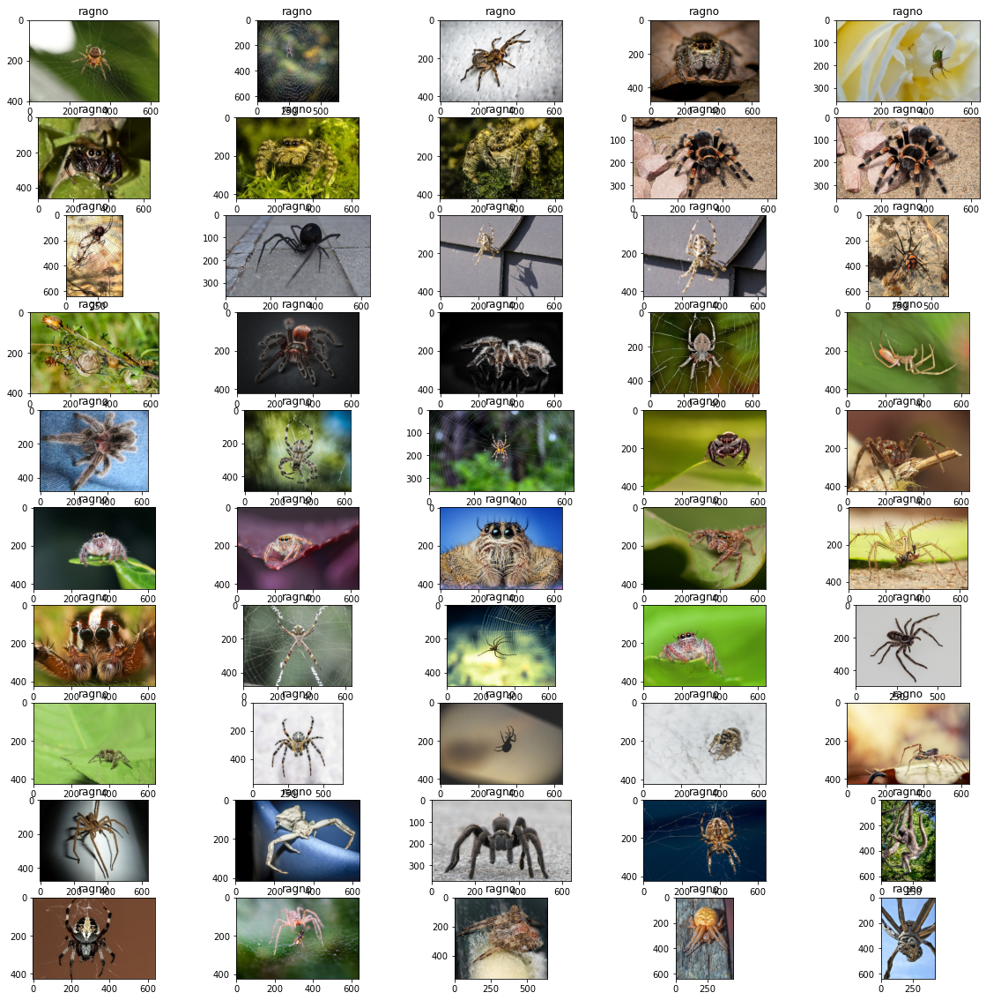

In [19]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 8].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])

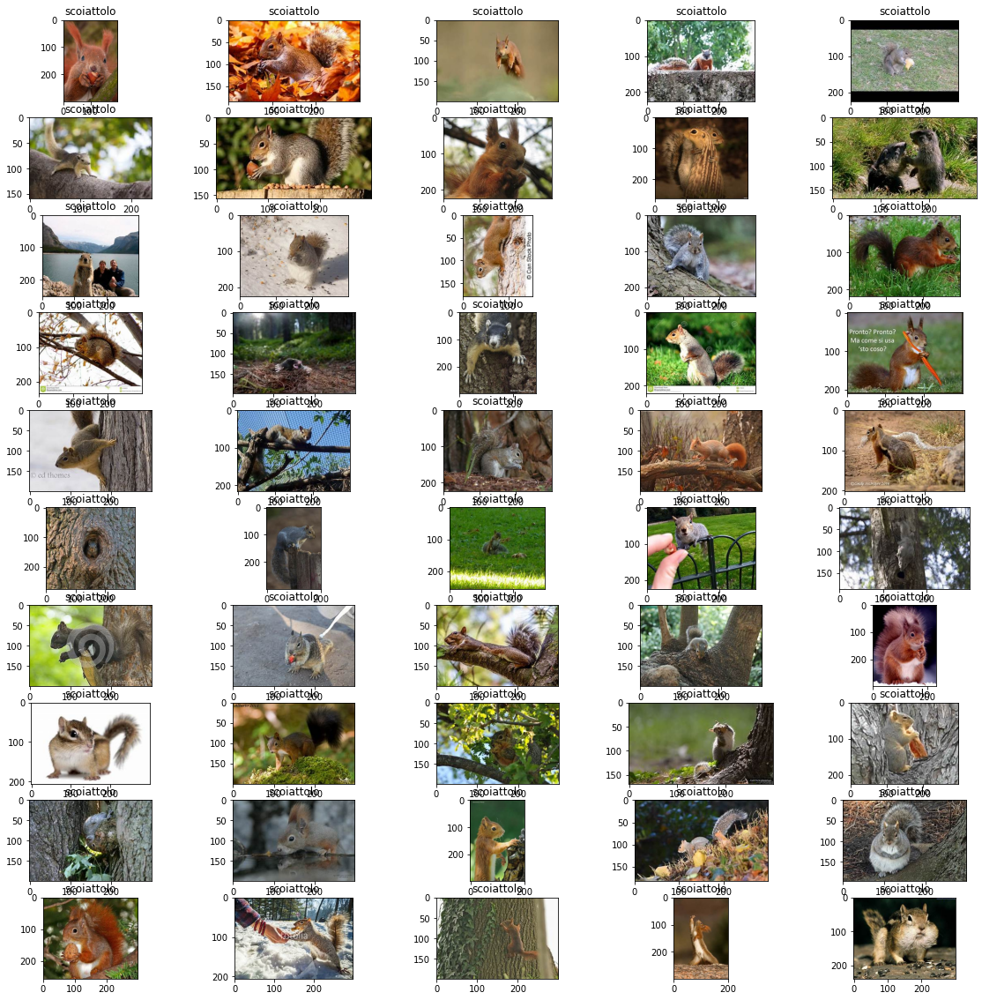

In [20]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 9].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])